# Snap Correlator
This notebook is designed to process multiple audio files recorded by AUVs (Autonomous Underwater Vehicles) and detect the snaps made by snapping shrimp throughout 4 AUV's. If a snap is found in one vehicle's audio file, the other 3 audio files are checked if they have recorded the same sound. This script will only document the the snaps that have been found in all 4 audio files.

In [ ]:
import numpy as np
from scipy.io.wavfile import read
from scipy import signal, arange
from scipy.signal import hilbert, find_peaks_cwt
import matplotlib.pyplot as plt
import matplotlib.axes as matax
import matplotlib.mlab as mlab
import sys
from math import exp
import operator
import csv
from math import log

Reading the audio files and turning them into an array of sound samples.

In [24]:
sampFreq7, unit7sampArray = read('unit7wav5.wav');
sampFreq8, unit8sampArray = read('unit8wav5.wav');
sampFreq13, unit13sampArray = read('unit13wav5.wav');
sampFreq20, unit20sampArray = read('unit20wav5.wav');

Setting the constants that will be used throughout the script. You can set the variables startTime and duration to be some number in seconds to just parse the times [startTime, duration]. For example, if you just want to analyze the part of the audio from 00:30 - 1:30, then set startTime = 30 and duration = 60.

In [25]:
#sample frequency set equal to one of the sound files
#sound frequency since it should be the same for all
#files anyway. Multiply all units in seconds by this value to get the
#index in the sound sample array
sampFreq = sampFreq7

#start time and duration measured in seconds
startTime = 0;
duration = duration = int(len(unit7sampArray)/sampFreq);

#in seconds
deadzoneInSeconds = 0.01

###DO NOT CHANGE THE NEXT TWO VARIABLES!!! 
#IF CHANGED PLEASE RESET leftOffset TO 50 AND rightOffset to 200
leftOffsetClassif = 50;  # how many frames we should expand the interval to the left (for the classfication algorithm)
rightOffsetClassif = 200; # how many frames we should expand ther interval to the right (for the classificaiton algorithm)
###DO NOT CHANGE THE LAST TWO VARIABLES!!!

#The deltaT (in seconds) for finding the same snap
#this basically is the size of window we will be looking at
#when trying to detect that snap from different audio files
#preliminarily making deltaT to be 70ms = 0.07s
deltaTinIndexes =  int(0.07 * sampFreq)


#actual array indexes for splicing
startIndex = sampFreq * startTime;
endIndex = startIndex + sampFreq * duration;


#splicing the array according to the startTime and duration variables
#all later operations will be done on this array and not the original
#big array
unit7splicedArray = unit7sampArray[startIndex:endIndex];
unit8splicedArray = unit8sampArray[startIndex:endIndex];
unit13splicedArray = unit13sampArray[startIndex:endIndex];
unit20splicedArray = unit20sampArray[startIndex:endIndex];

Preparing 2 time arrays for the spliced signals for plotting (if needed) the x axis
in future plots. Indexes and seconds.

In [26]:
timeArrayInIndexes = np.arange(0, endIndex-startIndex, 1)
timeArrayInSeconds = timeArrayInIndexes / sampFreq

Function that akes in the spliced array and returns an array of indexes and seconds where the amplitude
is above the threshold.

In [27]:

def detectAboveThreshold(splicedArray):
    #setting up the amplitude threshold
    ampThreshold = np.std(splicedArray) * 10;
    
    #creates a boolean array for each index of the spiced sound array
    #each index of this boolean array corresponds to 1 index of the 
    #spliced sound array. The value will be true if above threshold,
    #false otherwise
    aboveThres = splicedArray > ampThreshold 
    
    #pick out the time when the amplitude is above threshold
    # current = the first time in seconds frame has amplitude above threshold
    # highAmplitudeSeconds = the time where each loud signal above threshold
    # highAmplitudeIndexes = the time frame indices of each loud signal above threshold
    highAmplitudeSeconds = [];
    highAmplitudeIndexes = [];
    current = timeArrayInSeconds[aboveThres][0] 
    
    #initializing the arrays with the first values before the loop 
    highAmplitudeSeconds.append(current)
    highAmplitudeIndexes.append(current * sampFreq)
    
    # set a deadzone (set to 0.01 seconds in the earlier cell) 
    # time window that slides across the current array
    # so that we only collect one time data for each loud signal
    for timeInSeconds in timeArrayInSeconds[aboveThres]: 
    
        if (timeInSeconds > current + deadzoneInSeconds ):
            highAmplitudeIndexes.append(timeInSeconds * sampFreq)
            highAmplitudeSeconds.append(timeInSeconds)
            current = timeInSeconds
            
    
    return highAmplitudeIndexes, highAmplitudeSeconds;
    

In [28]:
#grabs the indexes and times when amplitude goes above threshold
highAmpIndexesUnit7, highAmpSecondsUnit7 = detectAboveThreshold(unit7splicedArray)
highAmpIndexesUnit8, highAmpSecondsUnit8 = detectAboveThreshold(unit8splicedArray)
highAmpIndexesUnit13, highAmpSecondsUnit13 = detectAboveThreshold(unit13splicedArray)
highAmpIndexesUnit20, highAmpSecondsUnit20 = detectAboveThreshold(unit20splicedArray)

A function that takes in the array of indexes of all signals (both snaps and pings)
above threshold and outputs the array of indexes where SNAPS were found. 

In [29]:
def getSnapIndexes(splicedArray, highAmpIndexes):
    snapIndexes = [];
    
    for i in range(0, len(highAmpIndexes)):
        frontIndex = int(highAmpIndexes[i] - leftOffsetClassif);
        backIndex = int(highAmpIndexes[i] + rightOffsetClassif);
        
        signalForClassification = splicedArray[frontIndex:backIndex]
        classification = classify(signalForClassification)
        
        
        if(classification == "Snap"):
            snapIndexes.append(highAmpIndexes[i]);
        
    
    return snapIndexes;
            

The function classify() takes in a small window in the sound sample array containing some signal (either snap or a ping) and classifies the signal. The functions getFrequencies() and getRatio() are helper functions that extracts the frequency content of the input signal and uses that value to classify.

In [ ]:
def classify(signal):
    
    ratio = getRatio(signal)
    if (ratio > 70):
        return "Ping"
    
    elif (ratio < 50):
        return "Snap"
    else:
        return "Undefined"

In [30]:
def getFrequencies(signal):
    length = len(signal) # length of the signal
    #k = arange(length)
    #T = length/sampFreq
    #frq = k/T # two sides frequency range
    #frq = frq[range(np.int(length/2))] # one side frequency range

    frequencies = np.fft.fft(signal)/length # fft computing and normalization
    frequencies = frequencies[range(np.int(length/2))]
    
    return abs(frequencies)

In [31]:
def getRatio(signal):
    frequencies = getFrequencies(signal)
    ratio = sum(frequencies[34:68] * 100/sum(frequencies))
    return ratio;
    

In [33]:
#gets the indeces where snaps are found in the sound sample array
snapIndexesUnit7 = getSnapIndexes(unit7splicedArray, highAmpIndexesUnit7);
snapIndexesUnit8 = getSnapIndexes(unit8splicedArray, highAmpIndexesUnit8);
snapIndexesUnit13 = getSnapIndexes(unit13splicedArray, highAmpIndexesUnit13);
snapIndexesUnit20 = getSnapIndexes(unit20splicedArray, highAmpIndexesUnit20);

A function that takes a list of indexes where snaps are found (snapIndexes) and a time (timeIndex). 
This function outputs true if there is a snap present in the snapIndexes list that is 
close enough to the timeIndex, false otherwise.

In [36]:
def snapPresent(snapIndexes, timeIndex):
    for snapIndex in snapIndexes:
        #print (snapIndex, timeIndex)
        if(snapIndex - deltaTinIndexes > timeIndex):
            break
       
        frontIndex = snapIndex - deltaTinIndexes 
        backIndex = snapIndex + deltaTinIndexes
        
        if (frontIndex < timeIndex and timeIndex < backIndex ):
            return True
    
    return False

A function that takes in an index of a snap that is present in one of the AUVs (unit 7 in this case) and 
checks if this snap exists in the other 3 recordings. Outputs true if this snap is present in all 3 of the 
other files.

In [37]:
def snapPresentInAll(snapIndexesUnit8, snapIndexesUnit13, snapIndexesUnit20, snapIndex):
    presentIn8 = snapPresent(snapIndexesUnit8, snapIndex)
    presentIn13 = snapPresent(snapIndexesUnit13, snapIndex)
    presentIn20 = snapPresent(snapIndexesUnit20, snapIndex)
    
    #print(presentIn8, presentIn13, presentIn20)
    return snapPresent(snapIndexesUnit8, snapIndex) and snapPresent(snapIndexesUnit13, snapIndex) and snapPresent(snapIndexesUnit20, snapIndex)
         

A function that takes in the index in the array where a snap has been found, an ax object to plot on, the array to plot from and plots the amplitude of a signal on the y axis and time on the x axis.

In [38]:
def plotAmplitude(snapIndex, ax, splicedArray):
    frontIndex = int(snapIndex - deltaTinIndexes)
    backIndex = int(snapIndex + deltaTinIndexes)
    
    #NOTE: I'm not sure if I'm splicing correctly here, only operate on the entire file now
    xAxis = timeArrayInSeconds[frontIndex-startIndex:backIndex+startIndex]
    yAxis = splicedArray[frontIndex:backIndex]
    
    
    ax.plot(xAxis, yAxis, label='signal')
    ax.set_xlabel('time [Seconds]', fontsize=5)
    ax.set_ylabel('Amplitude', fontsize=5)
    ax.tick_params(axis = 'both', labelsize = 5)
    ax.legend()
    #ax.set_xlim(front, back)
    #ax.margins(x=0)

overlappingSnaps will store a list of indeces where snaps were found in all 4 sound files.

In [39]:
overlappingSnaps = [];
for snapIndex in snapIndexesUnit7:
    #print(snapIndex)
    if (snapPresentInAll(snapIndexesUnit8, snapIndexesUnit13, snapIndexesUnit20, snapIndex)):
        overlappingSnaps.append(snapIndex)

A function that takes in the index in the array where a snap has been found, an ax object to plot on, the array to plot from and puts a red mark on the 2 largest spikes on the signal. Returns the indexes where we put the mark and the amplitude value where we marked.

In [41]:
def markPeaks(snapIndex, ax, splicedArray):
    
    #extracting the signal from the bigger array
    frontIndex = int(snapIndex - deltaTinIndexes)
    backIndex = int(snapIndex + deltaTinIndexes)
    signal = splicedArray[frontIndex:backIndex]
    timeInIndexes = timeArrayInSeconds[frontIndex-startIndex:backIndex+startIndex]
    
    #enveloping the signal
    analytic_signal = hilbert(signal)
    envelopedSignal = np.abs(analytic_signal)
    
    
    #peakIndexes contain the indeces of all the peaks found in the signal snippet 
    peakIndexes = find_peaks_cwt(envelopedSignal, arange(1, 20), noise_perc = 50);
    
    #peakInfo will contain a list of tuples in the form of 
    #(<index of the peak>, <amplitude value of the enveloped signal peak>)
    peakInfo=[]
    
    #populates the peakInfo
    for i in peakIndexes:
        data = (timeInIndexes[i],envelopedSignal[i])
        peakInfo.append(data)
    
    #sorts the tuple_array by the 2nd element (which is the amplitude)
    #so the leftmost element would be the peak with the highest
    #amplitude value
    peakInfo.sort(key = operator.itemgetter(1), reverse=True)
    
    #selected would contain the two highest amplitude peak 
    selected = []
    
    count = 0
    index = peakInfo[0][0]
    selected.append(peakInfo[0])
    
    #NOTE: DEADZONE VALUE UNPREDICTABLE
    deadzone = 0.0005 
    
    for i in range(0, len(peakInfo)):
    #for onePeakInfo in peakInfo:
        onePeakInfo = peakInfo[i]
        if (onePeakInfo[0] > index + deadzone):
            #ampPairs.append()
            selected.append(onePeakInfo)
            index = onePeakInfo[0]
            count = count + 1
            break
        #if (count == 1):
         #   break;
    
    #if a second peak was not found, append error values
    if (count == 0):
        selected.append((-1, -1))
        
    index_list = [x[0] for x in selected]

    amplitude_list = [x[1] for x in selected]
    ax.scatter(index_list, amplitude_list, c ='r')
    
   
    return index_list, amplitude_list
    
    

Makes plots: for each snap that was present in all 4 files, plot the amplutude plot from all 4 audio files in a single picture. Save plots in an image file in the designated path.

[5.654280087326911, 5.671760736477306]
[7.673104227416375, 7.6991648982458285]
[25.998549640463505, 26.003373994290165]
[30.93739026885086, 30.93813834903284]
[34.11239523060716, 34.1137997893162]
[50.085754415963116, 50.08775438542923]
[52.1848368727195, 52.188699409169324]
[54.76253797651944, 54.766431046854244]
[55.717958504450316, 55.71963786812415]
[58.06160211294484, 58.06363261629593]
[68.64498251935085, 68.64696722187448]
[68.75684340697089, 68.75882810949452]
[72.40503198424452, 72.4093677959115]
[85.48787041419214, 85.49322911100595]
[87.61788369643212, 87.61887604769393]
[87.61788369643212, 87.61887604769393]
[89.34819315735638, 89.38129188867346]
[91.93102395383276, 91.93477962168517]
[104.80061373108808, 104.80551441962719]


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


[108.319140165799, 108.32042258896811]
[110.49130547625226, 110.5605868612693]
[112.51008381551426, 112.51339674203447]
[114.09228866734858, 114.09702141952032]
[114.28833147585533, 114.29384284209401]
[117.41587151341201, 117.41800888536054]
[117.76647684768172, 117.76817147829804]
[121.82923924825575, 121.83183462847896]
[123.12576907222791, 123.12670035571976]
[123.34059021999664, 123.3410940290988]
[126.86713179951451, 126.87162028060641]
[132.06889971145478, 132.07381566693638]
[132.75093510022748, 132.75340834491075]
[138.25593502389276, 138.25872887436833]
[138.25593502389276, 138.25872887436833]
[138.69983664371537, 138.74011083800247]
[152.86986458222012, 152.87180348391627]
[156.6405703729714, 156.68353154913666]
[156.6405703729714, 156.68353154913666]
[161.30161371582113, 161.30407169356192]
[178.19643974901146, 178.20062289125357]
[181.97087067373016, 181.97276377459886]
[186.7260652509122, 186.72789728401094]
[187.12010503656433, 187.12083784980382]
[205.41123036289522, 20

[917.2704996870277, 917.2812628814827]
[921.0207477748431, 921.0233889558938]
[923.5611517381413, 923.562449428253]
[927.3752919802752, 927.3775514877635]
[934.6791804705272, 934.726401123647]
[934.6791804705272, 934.726401123647]
[939.2684539167341, 939.2791255095342]
[939.2684539167341, 939.2791255095342]
[942.8257583853682, 942.827407215157]
[945.370452359506, 945.3801926688142]
[948.4268484450619, 948.4335048319873]
[948.4268484450619, 948.4335048319873]
[948.6324178256821, 948.638219263828]
[950.0186104028946, 950.0879223217967]
[952.2854460237248, 952.2872475229386]
[954.1610357093784, 954.167569960764]
[954.6810125036259, 954.6821422573701]
[954.6810125036259, 954.6821422573701]
[960.5510297552709, 960.5521137081877]
[962.698080945329, 962.7029663669257]
[963.9904276270591, 964.0187630723195]
[964.2892016915772, 964.2919955420527]
[966.0728996503871, 966.0933115524954]
[970.2561029602601, 970.2650341216165]
[970.2561029602601, 970.2650341216165]
[970.8844750461825, 970.922734004

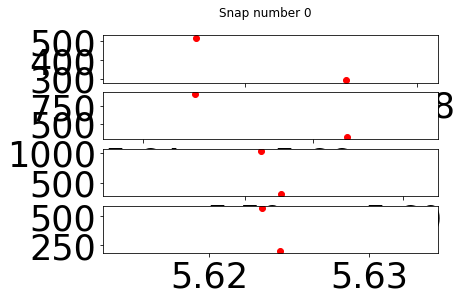

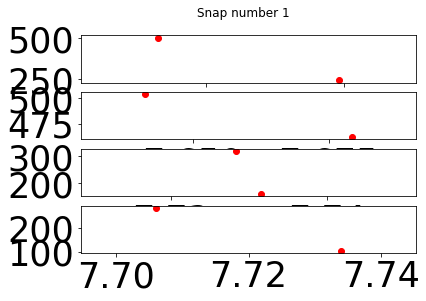

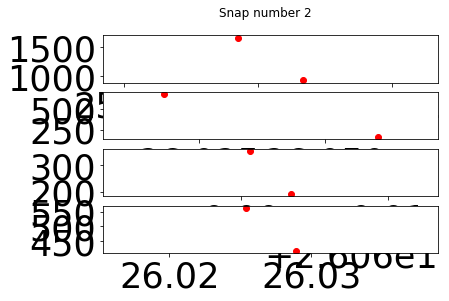

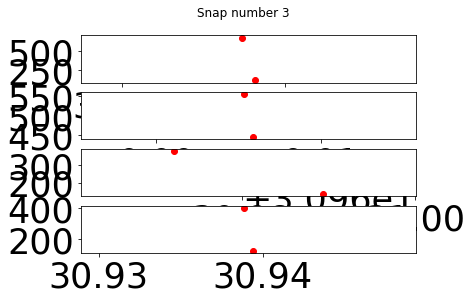

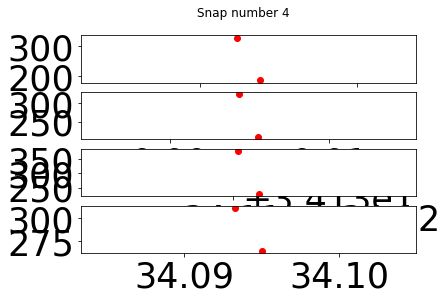

...

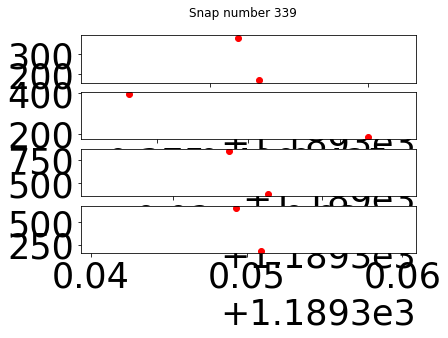

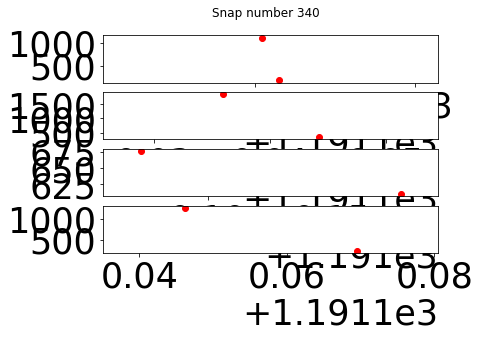

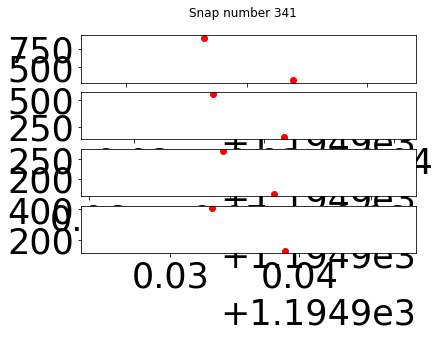

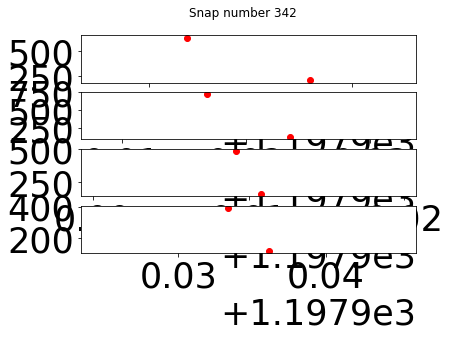

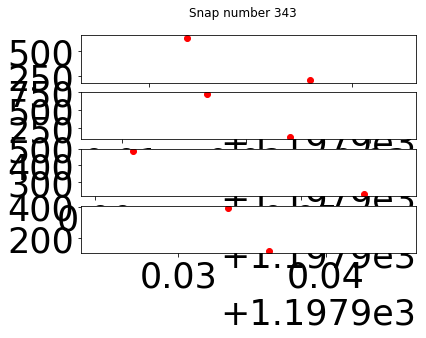

In [42]:
#stores the times where the peaks were seen
peaksTimeList7 = []
peaksTimeList8 = []
peaksTimeList13 = []
peaksTimeList20 = []

#stores the differences between the times in 2 peaks
peaksTimeDiff7 = []
peaksTimeDiff8 = []
peaksTimeDiff13 = []
peaksTimeDiff20 = []

#stores the amplitudes
peaksRefWaveAmp7 = []
peaksRefWaveAmp8 = []
peaksRefWaveAmp13 = []
peaksRefWaveAmp20 = []

for i in range(0, len(overlappingSnaps)):
    fig, axes = plt.subplots(nrows=4, ncols=1)
    fig.suptitle("Snap number %d"%(i))
    
    figPoster, axesPoster = plt.subplots(nrows=1, ncols=1)
    plt.rc('xtick', labelsize=35)
    plt.rc('ytick', labelsize=35)
    plt.rc('axes', labelsize=45)
   
    fname ='../Plots/CorrelatedSnapsTest/%d. %f-%f.png'% (i, (overlappingSnaps[i] - deltaTinIndexes)/sampFreq, (overlappingSnaps[i] + deltaTinIndexes)/sampFreq)
    fnamePoster ='../Plots/ForPosterStep2/%d. %f-%f.png'% (i, (overlappingSnaps[i] - deltaTinIndexes)/sampFreq, (overlappingSnaps[i] + deltaTinIndexes)/sampFreq)
    
    #plotAmplitude(overlappingSnaps[i], axes[0], unit7splicedArray)
    #plotAmplitude(overlappingSnaps[i], axes[1], unit8splicedArray)
    #plotAmplitude(overlappingSnaps[i], axes[2], unit13splicedArray)
    #plotAmplitude(overlappingSnaps[i], axes[3], unit20splicedArray)
    
    plotAmplitude(overlappingSnaps[i], axesPoster, unit7splicedArray)
    
    peaksTimeUnit7, peaksAmpl7 = markPeaks(overlappingSnaps[i], axes[0], unit7splicedArray)
    peaksTimeUnit8, peaksAmpl8 = markPeaks(overlappingSnaps[i], axes[1], unit8splicedArray)
    peaksTimeUnit13, peaksAmpl13 = markPeaks(overlappingSnaps[i], axes[2], unit13splicedArray)
    peaksTimeUnit20, peaksAmpl20 = markPeaks(overlappingSnaps[i], axes[3], unit20splicedArray)
    
    
    peaksTimeList7.append(peaksTimeUnit7)
    peaksTimeList8.append(peaksTimeUnit8)
    peaksTimeList13.append(peaksTimeUnit13)
    peaksTimeList20.append(peaksTimeUnit20)
    
    peaksRefWaveAmp7.append(peaksAmpl7[1])
    peaksRefWaveAmp8.append(peaksAmpl8[1])
    peaksRefWaveAmp13.append(peaksAmpl13[1])
    peaksRefWaveAmp20.append(peaksAmpl20[1])
    
    peaksTimeDiff7.append(peaksTimeUnit7[1] - peaksTimeUnit7[0])
    peaksTimeDiff8.append(peaksTimeUnit8[1] - peaksTimeUnit8[0])
    peaksTimeDiff13.append(peaksTimeUnit13[1] - peaksTimeUnit13[0])
    peaksTimeDiff20.append(peaksTimeUnit20[1] - peaksTimeUnit20[0])
    
    #fig.savefig(fname, dpi = 300)
    figPoster.savefig(fnamePoster, dpi = 300)
    
    plt.close()
    
    

A function that takes in a filename and a list of times of spikes (peaks) that were marked in our previous plots and outputs as a CSV file.

In [43]:

def outputCSV(filename, peaksTimeList):
    with open(filename, 'w') as csvfile:
        for i in range(0, len(peaksTimeList)):
            writer = csv.writer(csvfile, delimiter=',')
            #writer.writerow([str(peaksTimeList7[i][0]),str(peaksTimeList7[i][1])] )
            writer.writerow(peaksTimeList[i])

In [44]:


"""outputCSV('Unit7PeakTimes.csv', peaksTimeList7)
outputCSV('Unit8PeakTimes.csv', peaksTimeList8)
outputCSV('Unit13PeakTimes.csv', peaksTimeList13)
outputCSV('Unit20PeakTimes.csv', peaksTimeList20) """
        


344
344
344
344
344


"outputCSV('Unit7PeakTimes.csv', peaksTimeList7)\noutputCSV('Unit8PeakTimes.csv', peaksTimeList8)\noutputCSV('Unit13PeakTimes.csv', peaksTimeList13)\noutputCSV('Unit20PeakTimes.csv', peaksTimeList20) "

344
344


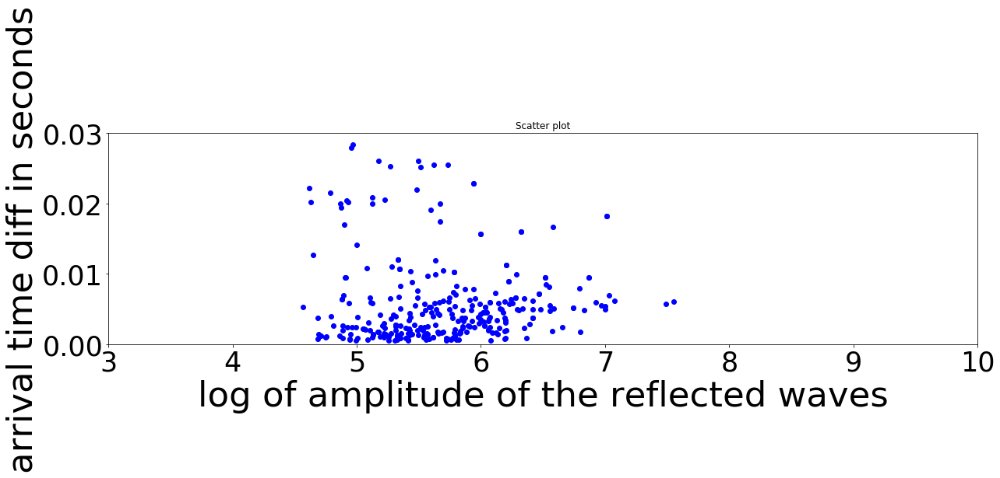

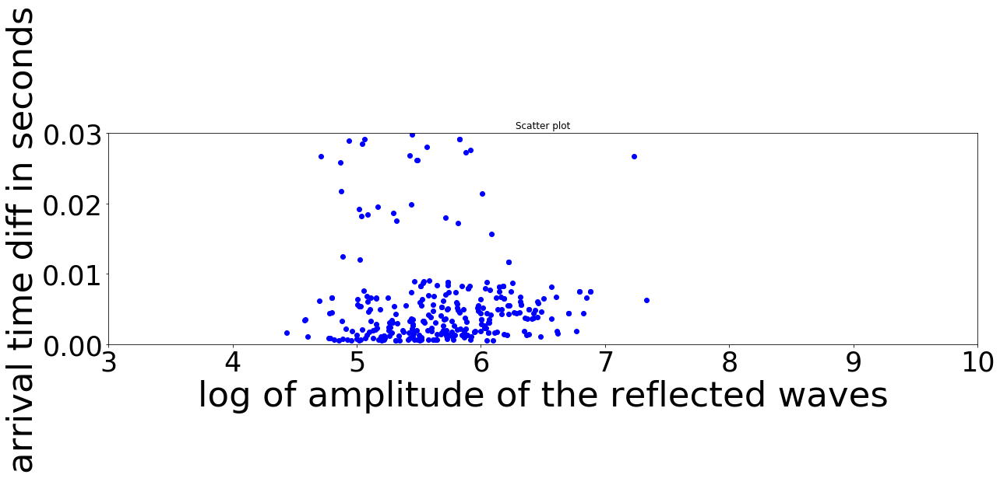

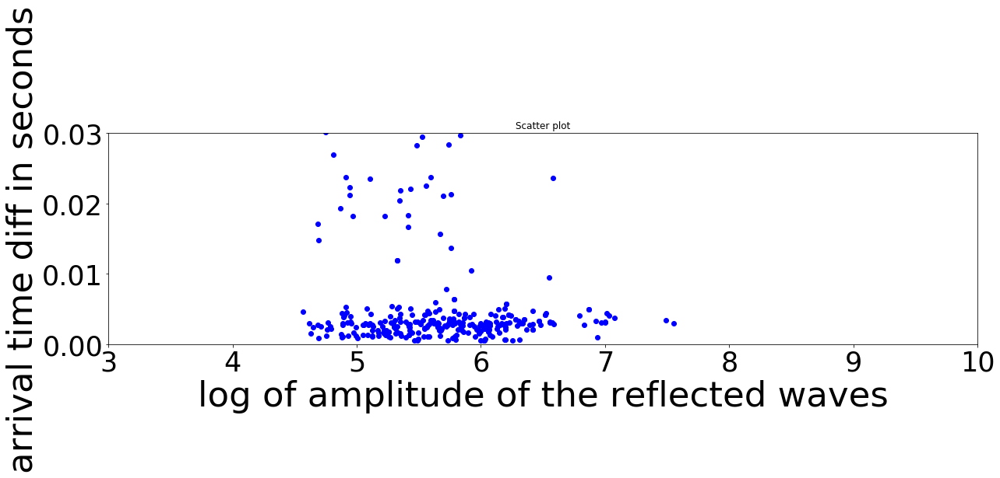

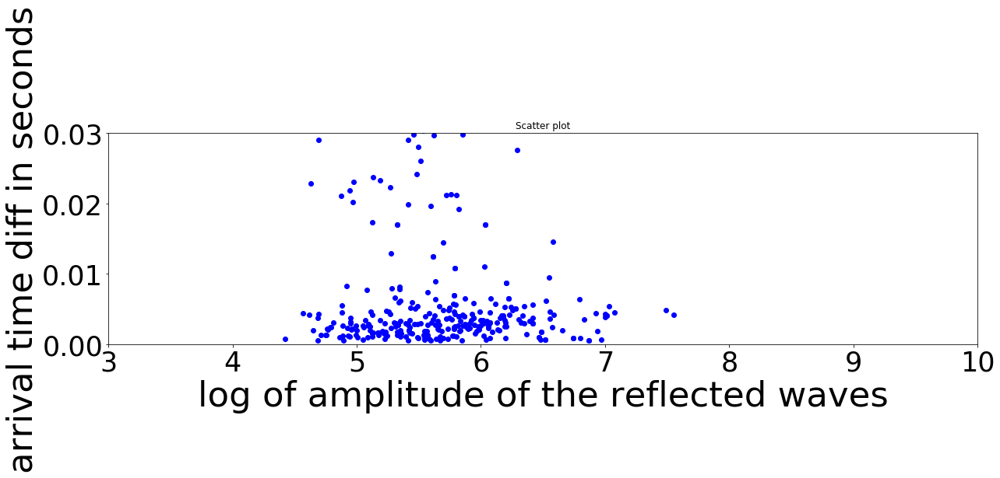

In [45]:
#Making the scatter plot
"""fig = plt.figure(figsize=(20, 5))
tuple1.sort(key = operator.itemgetter(0), reverse=True)
tuple2.sort(key = operator.itemgetter(0), reverse=True)
tuple1_amp = [x[0] for x in tuple1]
tuple2_amp = [x[0] for x in tuple2]
tuple1_timediff = [x[1] for x in tuple1]
tuple2_timediff = [x[1] for x in tuple2]

plt.scatter(tuple1_amp, tuple1_timediff, c ='b')
#plt.scatter(signal_id2, signal_timediff2, c ='r')
plt.title('Scatter plot')
plt.xlabel('log of amplitude of the reflected waves' )
plt.ylabel('arrival time diff in seconds')
plt.xlim(7,10)
plt.ylim(0,0.01)
plt.show() """

fig = plt.figure(figsize=(20, 5))

loggedAmps7 = [];
loggedAmps8 = [];
loggedAmps13 = [];
loggedAmps20 = [];
for i in range(0, len(peaksTimeList7)):
    loggedAmps7.append(log(abs(max(peaksRefWaveAmp7[i],exp(0.1)))))
    loggedAmps8.append(log(abs(max(peaksRefWaveAmp8[i],exp(0.1)))))
    loggedAmps13.append(log(abs(max(peaksRefWaveAmp13[i],exp(0.1)))))
    loggedAmps20.append(log(abs(max(peaksRefWaveAmp20[i],exp(0.1)))))



print(len(loggedAmps7))
print(len(peaksTimeDiff7))
plt.scatter(loggedAmps7, peaksTimeDiff7, c ='b')
#plt.scatter(signal_id2, signal_timediff2, c ='r')
plt.title('Scatter plot')
plt.xlabel('log of amplitude of the reflected waves' )
plt.ylabel('arrival time diff in seconds')
plt.xlim(3,10)
plt.ylim(0,0.03)
plt.show() 

fig = plt.figure(figsize=(20, 5))

plt.scatter(loggedAmps8, peaksTimeDiff8, c ='b')
#plt.scatter(signal_id2, signal_timediff2, c ='r')
plt.title('Scatter plot')
plt.xlabel('log of amplitude of the reflected waves' )
plt.ylabel('arrival time diff in seconds')
plt.xlim(3,10)
plt.ylim(0,0.03)
plt.show() 

fig = plt.figure(figsize=(20, 5))
plt.scatter(loggedAmps7, peaksTimeDiff13, c ='b')
#plt.scatter(signal_id2, signal_timediff2, c ='r')
plt.title('Scatter plot')
plt.xlabel('log of amplitude of the reflected waves' )
plt.ylabel('arrival time diff in seconds')
plt.xlim(3,10)
plt.ylim(0,0.03)
plt.show() 

fig = plt.figure(figsize=(20, 5))

plt.scatter(loggedAmps7, peaksTimeDiff20, c ='b')
#plt.scatter(signal_id2, signal_timediff2, c ='r')
plt.title('Scatter plot')
plt.xlabel('log of amplitude of the reflected waves' )
plt.ylabel('arrival time diff in seconds')
plt.xlim(3,10)
plt.ylim(0,0.03)
plt.show() 



In [46]:
def generateAmplitude():
    fig, axes = plt.subplots(nrows1, ncols=1)
    fig.suptitle("Snap number %f"%(i))